In [1]:
from AE_trainer import *

In [2]:
from acb_models import KS_AE

In [3]:
dataset = "ucsd1"
channels = 1
image_size = 128
batch_size = 16
skip = 1
population_factor = 2
loss_type = "MSE"
image_type = "normal"
tag = ""

In [4]:
models_dict = {
    "C2D_ACB": KS_AE()
}

In [5]:
model_tags = list(models_dict.keys())
trainer = AutoEncoder_Trainer(
                 models_list = model_tags,
                 dataset_type = dataset,
                 model_objects = [models_dict[key] for key in model_tags],
                 pretrained_models = None,
                 optimizer_type = "ADAM",
                 loss_type = loss_type,
                 image_size = image_size,
                 asImages = True,
                 n_frames = 16,
                 skip = skip,
                 population_factor = population_factor,
                 learning_rate = 1e-3,
                 batch_size = batch_size,
                 epochs = 100,
                 LRDecay = 0.5,
                 LRPatience = 3,
                 LRThreshold = 5e-3,
                 num_workers = 4, 
                 val_split = 0.1,
                 image_type = image_type,
                 addNoise = True,
                 status_rate = 10,
                 useGPU = True,
                 debug = True)

  3%|▎         | 1/34 [00:00<00:06,  5.25it/s]

DATASET: UCSD1


100%|██████████| 34/34 [00:06<00:00,  5.33it/s]


Number of samples: 6800
C2D_ACB_ucsd1_ADAM_MSE READY
LOSS: Mean Square Error
OPTIMIZER: Adam
Model Ready 
 --------------------


------------------------------------------------------------
Epoch: [001/100] | time/epoch: 127.63 seconds
------------------------------------------------------------
Model: C2D_ACB_ucsd1_ADAM_MSE
                Loss
Training    0.017881
Validation  0.008652
----------------------------------------
------------------------------------------------------------
Epoch: [010/100] | time/epoch: 128.10 seconds
------------------------------------------------------------
Model: C2D_ACB_ucsd1_ADAM_MSE
             Loss -2   Loss -1    Loss *
Training    0.005133  0.005057  0.005038
Validation  0.004894  0.004975  0.005053
----------------------------------------
------------------------------------------------------------
Epoch: [020/100] | time/epoch: 127.64 seconds
------------------------------------------------------------
Model: C2D_ACB_ucsd1_ADAM_MSE
             Loss -2   Loss -1    Loss *
Training    0.004587  0.004464  0.004375
Validation  0.005089  0.004514  0.004419
---------------

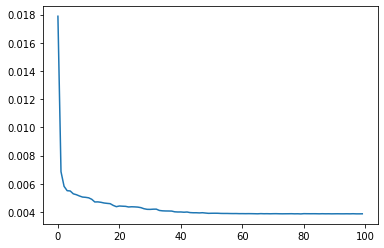

In [6]:
model_paths = trainer.train()

In [7]:
# sigmoid encodings
# half precision models

In [8]:
ds = DataSelector(dataset, image_size = image_size, train = False, skip = skip, population_factor = 1, image_type=image_type)

  0%|          | 0/36 [00:00<?, ?it/s]

DATASET: UCSD1


 50%|█████     | 18/36 [00:01<00:01,  9.07it/s]

-2


100%|██████████| 36/36 [00:04<00:00,  8.98it/s]

Number of samples: 7000


In [9]:
for m in trainer.models:
    model = m.model
    model_path = m.save_path
    tester = Tester(model, "autoencoder", ds.dataset, ds.test_loader, MSE_LOSS(), normalize_predictions=True)
    print(tester.test(os.path.join(model_path, "results.txt")))
    try: tester.save_reconstructions(file_name = os.path.join(model_path, "Reconstructions"))
    except: pass
    print("-"*40)
#     del tester

6004it [00:25, 235.18it/s]


{'ROC-AUC Score': 0.6718112863687143}
----------------------------------------


In [14]:
tester.results

{'metrics': {'ROC-AUC Score': 0.6718112863687143},
 'actual': array([0, 1, 0, ..., 1, 0, 1]),
 'predicted': array([0.21851883, 0.30438186, 0.41309982, ..., 0.34440957, 0.12189901,
        0.35317716]),
 'encodings': [tensor([[[[0.5013]],
  
           [[0.4979]],
  
           [[0.5329]],
  
           [[0.4937]],
  
           [[0.4982]],
  
           [[0.4880]],
  
           [[0.4981]],
  
           [[0.5302]],
  
           [[0.4793]],
  
           [[0.4979]],
  
           [[0.4986]],
  
           [[0.5021]],
  
           [[0.5518]],
  
           [[0.4979]],
  
           [[0.4984]],
  
           [[0.4981]],
  
           [[0.4992]],
  
           [[0.4696]],
  
           [[0.5089]],
  
           [[0.5021]],
  
           [[0.4980]],
  
           [[0.4981]],
  
           [[0.5025]],
  
           [[0.4978]],
  
           [[0.4979]],
  
           [[0.5001]],
  
           [[0.4977]],
  
           [[0.4994]],
  
           [[0.4978]],
  
           [[0.4690]],
  
     

In [13]:
from sklearn.svm import OneClassSVM
ocsvm = OneClassSVM()
y_pred = ocsvm.fit_predict([i.detach().cpu().numpy().flatten() for i in tester.results["encodings"]])
roc_auc_score(tester.results["actual"], y_pred)

0.45003331112591605